# Application Session 1

We have two main objectives today:

- First, we will use python, pandas and regular expressions to clear a dataset.
- Then, using that dataset, we will explore what the data has to offer.
- Using what we have learned, we will tokenize and create wordclouds.

One additional new things is going to be simple sentiment analysis using textblob.

In [ ]:
# Import the necessary modules in this code block.
import pandas as pd

In [ ]:
# Task 1: Import the imdb_top_1000.csv dataset.
movies = pd.read_csv('https://raw.githubusercontent.com/timuroeztuerk/data-science-lecture-S24/main/Datasets/imdb_top_1000.csv')

In [ ]:
# Print out the first few rows of the dataset.
movies.head()

,Poster_Link,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross
0,https://m.media-amazon.com/images/M/MV5BMDFkYT...,The Shawshank Redemption,1994,A,142 min,Drama,9.3,Two imprisoned men bond over a number of years...,80.0,Frank Darabont,Tim Robbins,Morgan Freeman,Bob Gunton,William Sadler,2343110,"28,341,469"
1,https://m.media-amazon.com/images/M/MV5BM2MyNj...,The Godfather,1972,A,175 min,"Crime, Drama",9.2,An organized crime dynasty's aging patriarch t...,100.0,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1620367,"134,966,411"
2,https://m.media-amazon.com/images/M/MV5BMTMxNT...,The Dark Knight,2008,UA,152 min,"Action, Crime, Drama",9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,"534,858,444"
3,https://m.media-amazon.com/images/M/MV5BMWMwMG...,The Godfather: Part II,1974,A,202 min,"Crime, Drama",9.0,The early life and career of Vito Corleone in ...,90.0,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton,1129952,"57,300,000"
4,https://m.media-amazon.com/images/M/MV5BMWU4N2...,12 Angry Men,1957,U,96 min,"Crime, Drama",9.0,A jury holdout attempts to prevent a miscarria...,96.0,Sidney Lumet,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler,689845,"4,360,000"


In [ ]:
# Display the type of each column. What do you observe here? What might create problems for you?
movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Poster_Link    1000 non-null   object 
 1   Series_Title   1000 non-null   object 
 2   Released_Year  1000 non-null   object 
 3   Certificate    899 non-null    object 
 4   Runtime        1000 non-null   object 
 5   Genre          1000 non-null   object 
 6   IMDB_Rating    1000 non-null   float64
 7   Overview       1000 non-null   object 
 8   Meta_score     843 non-null    float64
 9   Director       1000 non-null   object 
 10  Star1          1000 non-null   object 
 11  Star2          1000 non-null   object 
 12  Star3          1000 non-null   object 
 13  Star4          1000 non-null   object 
 14  No_of_Votes    1000 non-null   int64  
 15  Gross          831 non-null    object 
dtypes: float64(2), int64(1), object(13)
memory usage: 125.1+ KB


In [ ]:
# Convert the Gross column to int. It is an object because it has commas. First, drop the NaN values.
movies = movies.dropna(subset=['Gross'])
movies['Gross'] = movies['Gross'].str.replace(',', '', regex=False).astype(int)

<ipython-input-5-de8225922fe3>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  movies['Gross'] = movies['Gross'].str.replace(',', '', regex=False).astype(int)


In [ ]:
# Drop Poster_Link, Certificate, Meta_score.
movies = movies.drop(columns=['Poster_Link', 'Certificate', 'Meta_score'], axis=1)

In [ ]:
movies.head()

,series_title,released_year,runtime,genre,imdb_rating,overview,director,star1,star2,star3,star4,no_of_votes,gross
0,The Shawshank Redemption,1994,142 min,Drama,9.3,Two imprisoned men bond over a number of years...,Frank Darabont,Tim Robbins,Morgan Freeman,Bob Gunton,William Sadler,2343110,28341469
1,The Godfather,1972,175 min,"Crime, Drama",9.2,An organized crime dynasty's aging patriarch t...,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1620367,134966411
2,The Dark Knight,2008,152 min,"Action, Crime, Drama",9.0,When the menace known as the Joker wreaks havo...,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,534858444
3,The Godfather: Part II,1974,202 min,"Crime, Drama",9.0,The early life and career of Vito Corleone in ...,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton,1129952,57300000
4,12 Angry Men,1957,96 min,"Crime, Drama",9.0,A jury holdout attempts to prevent a miscarria...,Sidney Lumet,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler,689845,4360000


In [ ]:
# Lowercase all the columns.
movies.columns = movies.columns.str.lower()

In [ ]:
# Let's see how our dataset looks now.
movies.head()

,series_title,released_year,runtime,genre,imdb_rating,overview,director,star1,star2,star3,star4,no_of_votes,gross
0,The Shawshank Redemption,1994,142,Drama,9.3,Two imprisoned men bond over a number of years...,Frank Darabont,Tim Robbins,Morgan Freeman,Bob Gunton,William Sadler,2343110,28341469
1,The Godfather,1972,175,"Crime, Drama",9.2,An organized crime dynasty's aging patriarch t...,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1620367,134966411
2,The Dark Knight,2008,152,"Action, Crime, Drama",9.0,When the menace known as the Joker wreaks havo...,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,534858444
3,The Godfather: Part II,1974,202,"Crime, Drama",9.0,The early life and career of Vito Corleone in ...,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton,1129952,57300000
4,12 Angry Men,1957,96,"Crime, Drama",9.0,A jury holdout attempts to prevent a miscarria...,Sidney Lumet,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler,689845,4360000


In [ ]:
# Runtime seems to be as an object as well. Let's fix that.
movies['runtime'] = movies['runtime'].str.replace(' min', '', regex=False).astype(int)

In [ ]:
movies.info()

<class 'pandas.core.frame.DataFrame'>
Index: 831 entries, 0 to 997
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   series_title   831 non-null    object 
 1   released_year  831 non-null    object 
 2   runtime        831 non-null    int64  
 3   genre          831 non-null    object 
 4   imdb_rating    831 non-null    float64
 5   overview       831 non-null    object 
 6   director       831 non-null    object 
 7   star1          831 non-null    object 
 8   star2          831 non-null    object 
 9   star3          831 non-null    object 
 10  star4          831 non-null    object 
 11  no_of_votes    831 non-null    int64  
 12  gross          831 non-null    int64  
dtypes: float64(1), int64(3), object(9)
memory usage: 90.9+ KB


In [ ]:
movies['released_year'] = pd.to_numeric(movies['released_year'])

ValueError: Unable to parse string "PG" at position 803

In [ ]:
# I'm mostly interested in over time trends, if we can find out any. For this, I suggest that we create decade and 5-year intervals.
movies['released_year'] = pd.to_numeric(movies['released_year'],errors='coerce')
# Decade calculation
movies['decade'] = (movies['released_year'] // 10) * 10
# 5-Year Interval Calculation
movies['five_year_group'] = (movies['released_year'] // 5) * 5

In [ ]:
# Let's see how our dataset looks now.
movies.head()

,series_title,released_year,runtime,genre,imdb_rating,overview,director,star1,star2,star3,star4,no_of_votes,gross,decade,five_year_group
0,The Shawshank Redemption,1994.0,142,Drama,9.3,Two imprisoned men bond over a number of years...,Frank Darabont,Tim Robbins,Morgan Freeman,Bob Gunton,William Sadler,2343110,28341469,1990.0,1990.0
1,The Godfather,1972.0,175,"Crime, Drama",9.2,An organized crime dynasty's aging patriarch t...,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1620367,134966411,1970.0,1970.0
2,The Dark Knight,2008.0,152,"Action, Crime, Drama",9.0,When the menace known as the Joker wreaks havo...,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,534858444,2000.0,2005.0
3,The Godfather: Part II,1974.0,202,"Crime, Drama",9.0,The early life and career of Vito Corleone in ...,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton,1129952,57300000,1970.0,1970.0
4,12 Angry Men,1957.0,96,"Crime, Drama",9.0,A jury holdout attempts to prevent a miscarria...,Sidney Lumet,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler,689845,4360000,1950.0,1955.0


# Quick Introduction to Matplotlib and Seaborn

Matplotlib is a widely used Python plotting library for creating static, interactive, and animated visualizations in Python. It provides a MATLAB-like interface for creating plots and can be used to generate various types of plots, including line plots, scatter plots, bar plots, histograms, and more. Matplotlib is highly customizable and can be used to create publication-quality figures.

Seaborn is a Python visualization library based on Matplotlib that provides a high-level interface for drawing attractive and informative statistical graphics. It simplifies the process of creating complex visualizations by providing functions to visualize statistical relationships in datasets, such as scatter plots, box plots, violin plots, pair plots, and more. Seaborn also offers built-in themes and color palettes to enhance the aesthetics of plots. Overall, Seaborn complements Matplotlib by providing a higher-level interface for creating statistical visualizations with less code.

In [ ]:
# Import the packages.
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# Set the style. This is purely aesthetic, you can also skip this part.
sns.set(style="whitegrid")

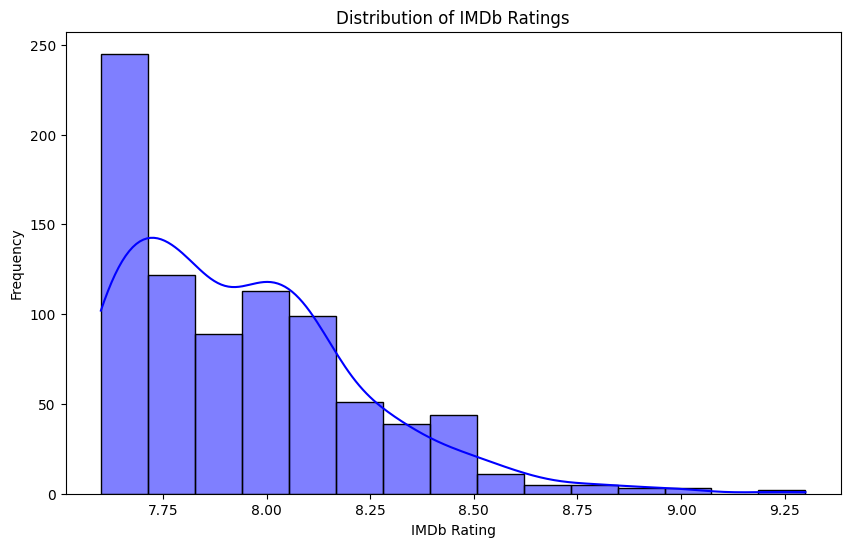

In [ ]:
# An example plot.
# Distribution of IMDb Ratings
plt.figure(figsize=(10, 6)) # Size of 10 cm in width and 6 cm in height.


sns.histplot(movies['imdb_rating'], bins=15, kde=True, color='blue')
# This line is the most important one.
# This line creates a histogram plot using Seaborn's histplot function.
# It takes in the IMDb ratings data from the 'imdb_rating' column of a DataFrame called 'movies'.
# The parameter bins=15 specifies the number of bins for the histogram,
# kde=True adds a kernel density estimate curve to the plot, and color='blue' sets the color of the bars to blue.

plt.title('Distribution of IMDb Ratings')

plt.xlabel('IMDb Rating')

plt.ylabel('Frequency')

plt.show()

<Axes: xlabel='imdb_rating', ylabel='Count'>

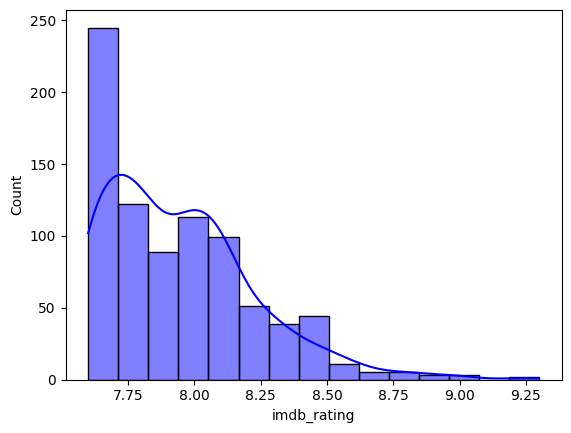

In [ ]:
# You can also do this only by one line. But for consistency, completeness and for customization it is recommended to use all functions of matplotlib.
sns.histplot(movies['imdb_rating'], bins=15, kde=True, color='blue')

In [ ]:
# Let's go a bit advanced and create a trends dataset. If confused, see pandas .groupby option from the documentation.
trends_data = movies.groupby('released_year').agg(num_movies=('series_title', 'count'),average_rating=('imdb_rating', 'mean'),total_gross=('gross', 'sum')).reset_index()

In [ ]:
trends_data

,released_year,num_movies,average_rating,total_gross
0,1921.0,1,8.300000,5450000
1,1924.0,1,8.200000,977375
2,1925.0,2,8.100000,5500970
3,1926.0,1,8.100000,1033895
4,1927.0,2,8.200000,1775706
...,...,...,...,...
89,2015.0,23,7.873913,2462336868
90,2016.0,23,7.930435,2595557425
91,2017.0,20,7.840000,2061312852
92,2018.0,14,7.992857,2607757362


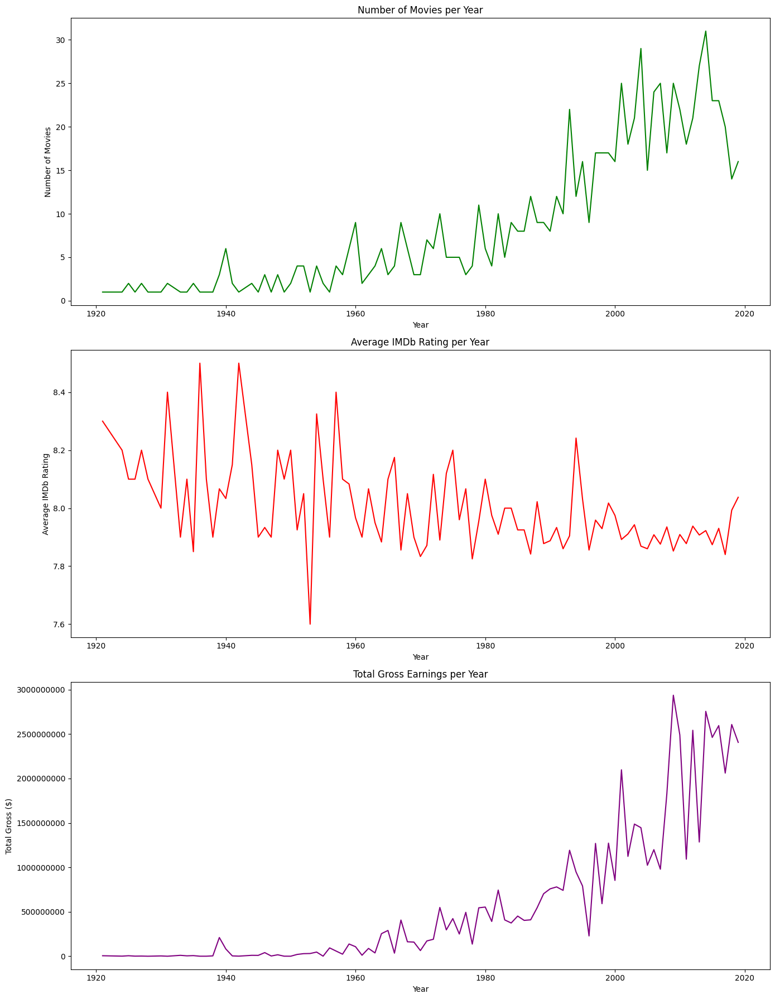

In [ ]:
# Another advanced technique, this time with matplotlib.
fig, ax = plt.subplots(3, 1, figsize=(14, 18))

sns.lineplot(x='released_year', y='num_movies', data=trends_data, ax=ax[0], color='green')
ax[0].set_title('Number of Movies per Year')
ax[0].set_xlabel('Year')
ax[0].set_ylabel('Number of Movies')

sns.lineplot(x='released_year', y='average_rating', data=trends_data, ax=ax[1], color='red')
ax[1].set_title('Average IMDb Rating per Year')
ax[1].set_xlabel('Year')
ax[1].set_ylabel('Average IMDb Rating')

sns.lineplot(x='released_year', y='total_gross', data=trends_data, ax=ax[2], color='purple')
ax[2].set_title('Total Gross Earnings per Year')
ax[2].set_xlabel('Year')
ax[2].set_ylabel('Total Gross ($)')
ax[2].ticklabel_format(style='plain', axis='y')  # Disable scientific notation for better clarity

plt.tight_layout()
plt.show()

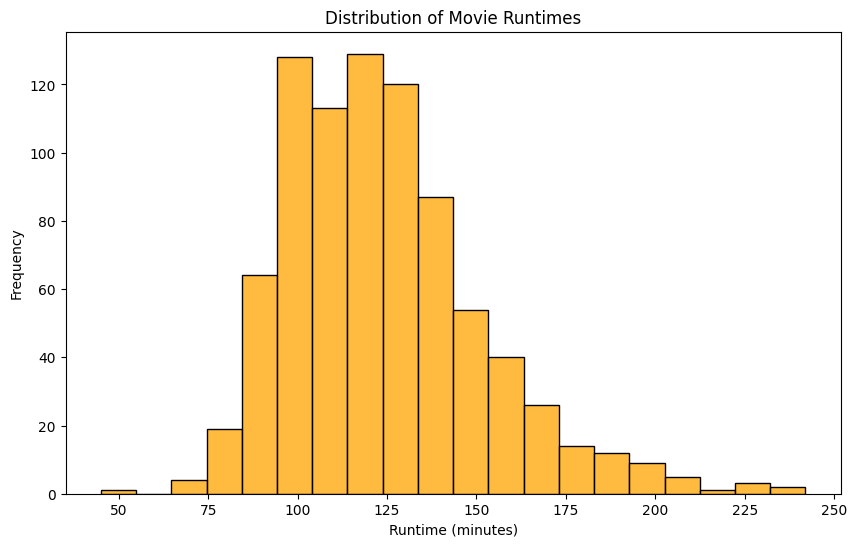

In [ ]:
# Enough showing off, now let's go back to basics.
# Runtimes.
plt.figure(figsize=(10, 6))
sns.histplot(movies['runtime'], bins=20, color='orange')
plt.title('Distribution of Movie Runtimes')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Frequency')
plt.show()

<Axes: xlabel='runtime', ylabel='Count'>

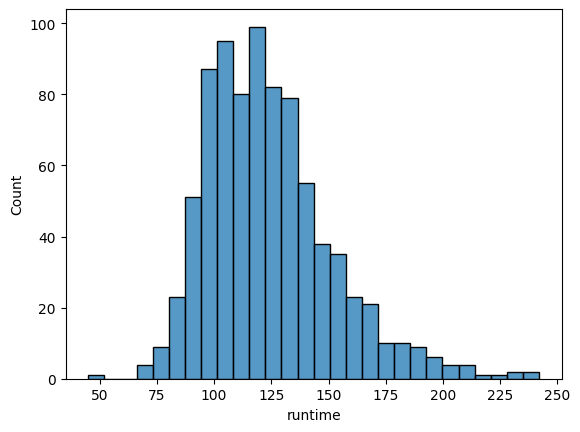

In [ ]:
# You can even go more minimalistic.
sns.histplot(movies['runtime'])

In [ ]:
# Aggregating data to find top directors by frequency and their average ratings
top_directors = movies.groupby('director').agg(
    num_movies=('director', 'count'),
    average_rating=('imdb_rating', 'mean')
).sort_values(by='num_movies', ascending=False).head(10)

top_directors

# Becoming a Nolan fan should be easier now. Although, is it really representative here?

,num_movies,average_rating
director,,
Steven Spielberg,13,8.030769
Martin Scorsese,10,8.170000
Alfred Hitchcock,9,8.144444
Quentin Tarantino,8,8.175000
Clint Eastwood,8,7.912500
David Fincher,8,8.037500
Christopher Nolan,8,8.462500
Woody Allen,8,7.800000
Rob Reiner,7,7.828571


In [ ]:
# Combining star columns and calculating top actors by frequency and their average ratings
actors_columns = ['star1', 'star2', 'star3', 'star4']

actors_data = movies[actors_columns].melt(value_name='actor')

actors_summary = actors_data.groupby('actor').agg(
    num_movies=('actor', 'count'),
    average_rating=('actor', lambda x: movies.loc[movies[actors_columns].isin([x.name]).any(axis=1), 'imdb_rating'].mean())
).sort_values(by='num_movies', ascending=False).head(10)

def average_rating_for_actor(actor_name):
    is_actor_present = movies[actors_columns].isin([actor_name]).any(axis=1)
    return movies.loc[is_actor_present, 'imdb_rating'].mean()

actors_summary['average_rating'] = actors_summary.index.map(average_rating_for_actor)
actors_summary

,num_movies,average_rating
actor,,
Robert De Niro,17,8.117647
Tom Hanks,14,8.035714
Al Pacino,13,8.076923
Brad Pitt,12,8.016667
Matt Damon,11,8.009091
Leonardo DiCaprio,11,8.127273
Christian Bale,11,8.045455
Clint Eastwood,11,7.981818
Johnny Depp,9,7.733333


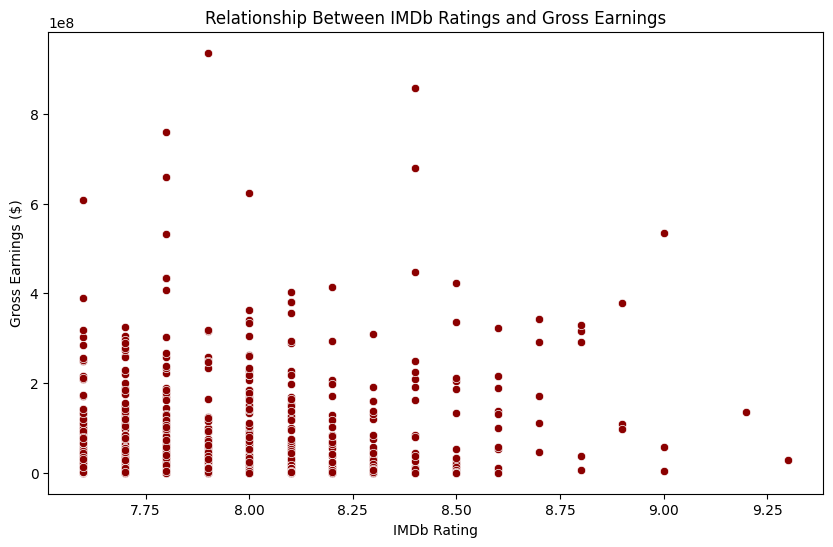

In [ ]:
# IMDb ratings and gross earnings
plt.figure(figsize=(10, 6))
sns.scatterplot(x='imdb_rating', y='gross', data=movies, color='darkred')
plt.title('Relationship Between IMDb Ratings and Gross Earnings')
plt.xlabel('IMDb Rating')
plt.ylabel('Gross Earnings ($)')
plt.show()

<ipython-input-36-d80c253edce2>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='decade', y='average_runtime', data=runtime_by_decade, palette='viridis')


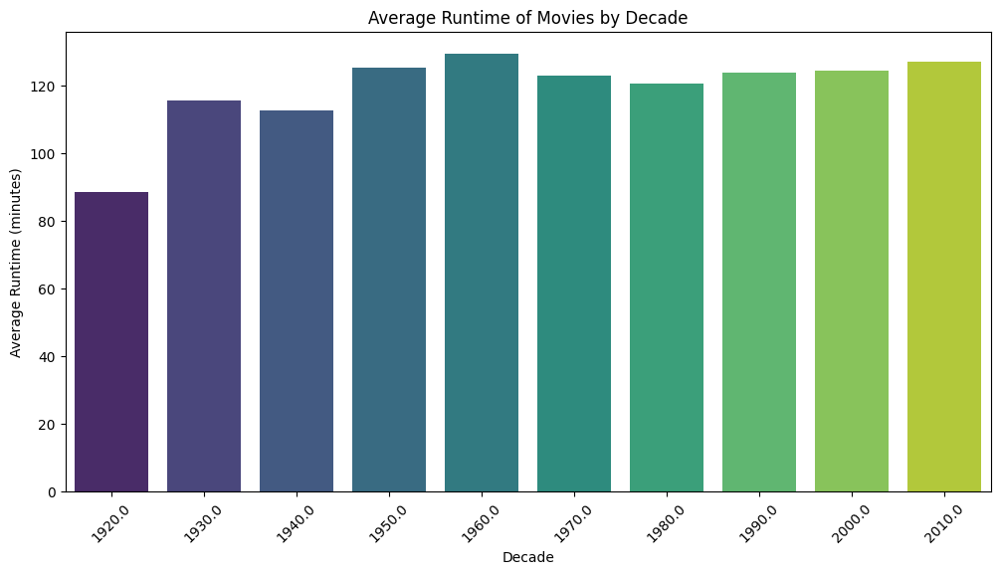

In [ ]:
# Average runtime per decade
runtime_by_decade = movies.groupby('decade').agg(
    average_runtime=('runtime', 'mean')
).reset_index()


plt.figure(figsize=(12, 6))
sns.barplot(x='decade', y='average_runtime', data=runtime_by_decade, palette='viridis')
plt.title('Average Runtime of Movies by Decade')
plt.xlabel('Decade')
plt.ylabel('Average Runtime (minutes)')
plt.xticks(rotation=45)
plt.show()

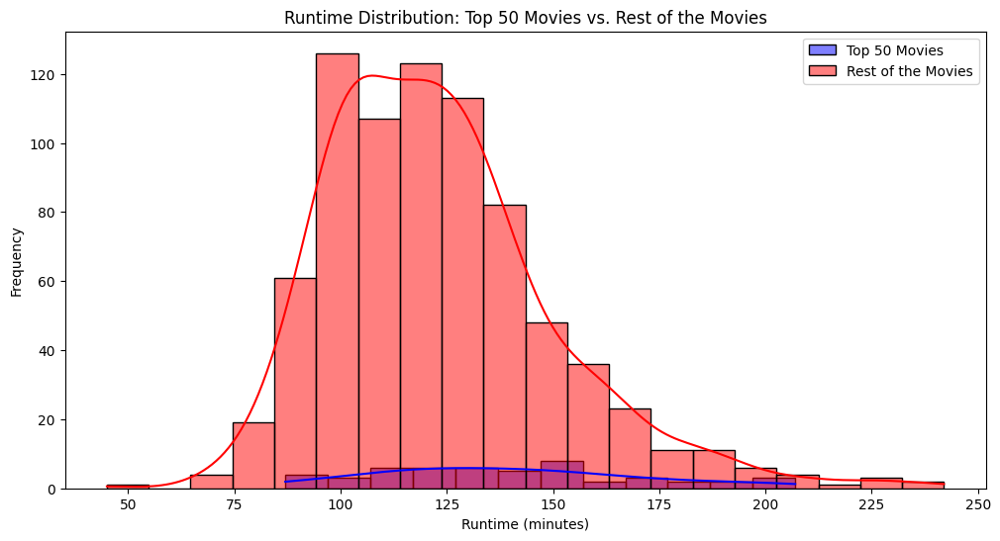

In [ ]:
# Sorting the data by rating and taking the top 50 movies
top_50_movies = movies.sort_values(by='imdb_rating', ascending=False).head(50)

# Rest of the movies
rest_movies = movies.sort_values(by='imdb_rating', ascending=False).iloc[50:]

# Distribution of Runtimes
plt.figure(figsize=(12, 6))
sns.histplot(top_50_movies['runtime'], color='blue', label='Top 50 Movies', kde=True, binwidth=10)
sns.histplot(rest_movies['runtime'], color='red', label='Rest of the Movies', kde=True, binwidth=10)
plt.title('Runtime Distribution: Top 50 Movies vs. Rest of the Movies')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Frequency')
plt.legend()
plt.show()

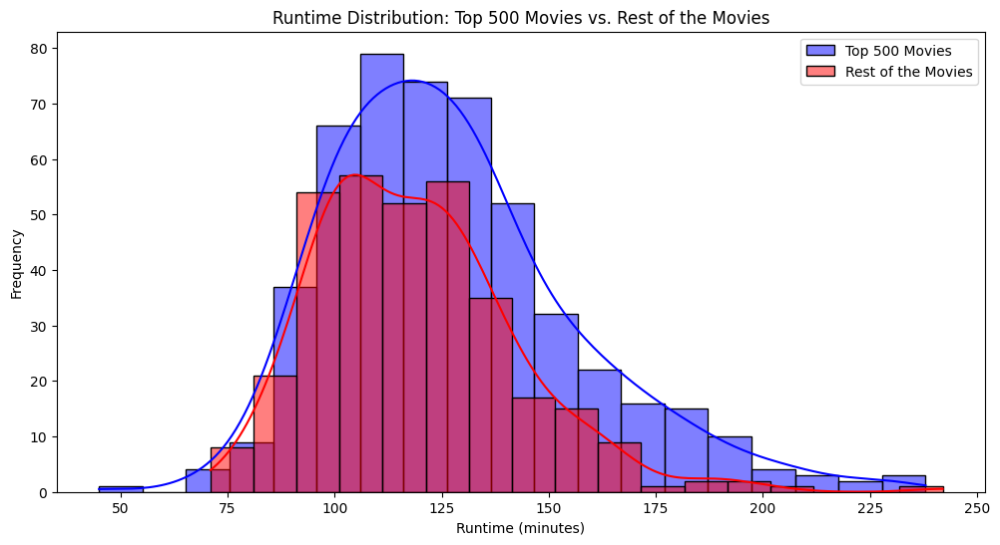

In [ ]:
# Top 500 movies
top_500_movies = movies.sort_values(by='imdb_rating', ascending=False).head(500)

# Rest of the movies
rest_movies = movies.sort_values(by='imdb_rating', ascending=False).iloc[500:]

# Top 500 movies and the rest
plt.figure(figsize=(12, 6))
sns.histplot(top_500_movies['runtime'], color='blue', label='Top 500 Movies', kde=True, binwidth=10)
sns.histplot(rest_movies['runtime'], color='red', label='Rest of the Movies', kde=True, binwidth=10)
plt.title('Runtime Distribution: Top 500 Movies vs. Rest of the Movies')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Frequency')
plt.legend()
plt.show()

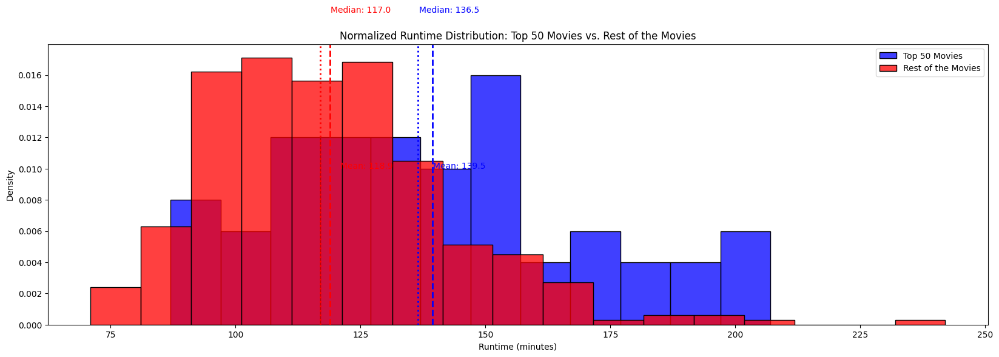

(139.46, 136.5, 118.9214501510574, 117.0)

In [ ]:
# Normalization or Kernel Densities
plt.figure(figsize=(20, 6))
sns.histplot(top_50_movies['runtime'], color='blue', label='Top 50 Movies', kde=False, stat="density", binwidth=10)
sns.histplot(rest_movies['runtime'], color='red', label='Rest of the Movies', kde=False, stat="density", binwidth=10)

# The rest of this code is advanced, if you feel confused, try to pay attention at the objects.
# Calculating and displaying mean and median runtimes
mean_top_50 = top_50_movies['runtime'].mean()
median_top_50 = top_50_movies['runtime'].median()
mean_rest = rest_movies['runtime'].mean()
median_rest = rest_movies['runtime'].median()

# Adding mean and median lines and labels to the plot
plt.axvline(mean_top_50, color='blue', linestyle='dashed', linewidth=2)
plt.text(mean_top_50 + 0.1, 0.01, f'Mean: {mean_top_50:.1f}', color='blue')
plt.axvline(median_top_50, color='blue', linestyle='dotted', linewidth=2)
plt.text(median_top_50 + 0.2, 0.02, f'Median: {median_top_50:.1f}', color='blue')

plt.axvline(mean_rest, color='red', linestyle='dashed', linewidth=2)
plt.text(mean_rest + 2, 0.01, f'Mean: {mean_rest:.1f}', color='red')
plt.axvline(median_rest, color='red', linestyle='dotted', linewidth=2)
plt.text(median_rest + 2, 0.02, f'Median: {median_rest:.1f}', color='red')

plt.title('Normalized Runtime Distribution: Top 50 Movies vs. Rest of the Movies')
plt.xlabel('Runtime (minutes)')
plt.ylabel('Density')
plt.legend()
plt.show()

mean_top_50, median_top_50, mean_rest, median_rest

In [ ]:
# Creating an empty DataFrame for director-actor pairs.
director_actor_pairs = pd.DataFrame()

# Adding director and each actor into the pair DataFrame. Very concise and good code below!
for col in ['star1', 'star2', 'star3', 'star4']:
    temp_df = movies[['director', col, 'imdb_rating']]
    temp_df.columns = ['director', 'actor', 'imdb_rating']
    director_actor_pairs = pd.concat([director_actor_pairs, temp_df])

# Grouping by director and actor to calculate frequency and average rating
collaboration_summary = director_actor_pairs.groupby(['director', 'actor']).agg(
    num_movies=('imdb_rating', 'count'),
    average_rating=('imdb_rating', 'mean')
).sort_values(by='num_movies', ascending=False)

# Filter to show only those pairs that have collaborated on at least 3 films
frequent_collaborations = collaboration_summary[collaboration_summary['num_movies'] >= 3]
frequent_collaborations.head(20)

,,num_movies,average_rating
director,actor,,
Joel Coen,Ethan Coen,6,7.816667
Martin Scorsese,Robert De Niro,6,8.183333
Peter Jackson,Ian McKellen,5,8.400000
Charles Chaplin,Charles Chaplin,5,8.380000
Clint Eastwood,Clint Eastwood,5,7.960000
Richard Linklater,Ethan Hawke,5,7.960000
Martin Scorsese,Joe Pesci,4,8.250000
Anthony Russo,Joe Russo,4,8.075000
Christopher Nolan,Christian Bale,4,8.525000


In [ ]:
# Extracting the list of frequent collaborators
frequent_director_actor_pairs = frequent_collaborations.reset_index()[['director', 'actor']]

# Function to calculate average ratings for directors and actors outside their frequent collaborations
def get_non_collab_ratings(row):
    director_movies = director_actor_pairs[(director_actor_pairs['director'] == row['director']) & (director_actor_pairs['actor'] != row['actor'])]
    actor_movies = director_actor_pairs[(director_actor_pairs['actor'] == row['actor']) & (director_actor_pairs['director'] != row['director'])]
    return {
        'director_avg_rating_outside': director_movies['imdb_rating'].mean(),
        'actor_avg_rating_outside': actor_movies['imdb_rating'].mean()
    }

# Applying the function to each pair
non_collab_ratings = frequent_director_actor_pairs.apply(get_non_collab_ratings, axis=1, result_type='expand')

# Adding these results back to the frequent collaborations dataframe
frequent_collaborations = frequent_collaborations.reset_index()
frequent_collaborations = pd.concat([frequent_collaborations, non_collab_ratings], axis=1)

frequent_collaborations.head(5)

,director,actor,num_movies,average_rating,director_avg_rating_outside,actor_avg_rating_outside
0,Joel Coen,Ethan Coen,6,7.816667,7.816667,NaN
1,Martin Scorsese,Robert De Niro,6,8.183333,8.167647,8.081818
2,Peter Jackson,Ian McKellen,5,8.400000,8.400000,7.750000
3,Charles Chaplin,Charles Chaplin,5,8.380000,8.380000,NaN
4,Clint Eastwood,Clint Eastwood,5,7.960000,7.903704,8.000000


In [ ]:
text = 'this is magnificent'

TextBlob(text).sentiment.polarity

1.0

In [ ]:
from textblob import TextBlob

# Function to classify sentiment based on polarity
def sentiment_classification(text):
    sentiment = TextBlob(text).sentiment.polarity
    if sentiment > 0:
        return 'Positive'
    elif sentiment < 0:
        return 'Negative'
    else:
        return 'Neutral'

# Applying sentiment analysis to the overview column
movies['sentiment'] = movies['overview'].apply(sentiment_classification)

# Grouping movies by sentiment to calculate average IMDb ratings
sentiment_rating_comparison = movies.groupby('sentiment').agg(
    average_rating=('imdb_rating', 'mean'),
    count=('imdb_rating', 'count')
)

sentiment_rating_comparison

,average_rating,count
sentiment,,
Negative,7.968919,296
Neutral,7.959459,185
Positive,7.921714,350


In [ ]:
# List of main genres to analyze
main_genres = ['Drama', 'Comedy', 'Action', 'Thriller', 'Romance']

# Dictionary to hold simpler sentiment analysis results for each genre
simple_genre_sentiment_results = {}

for genre in main_genres:
    # Filtering data for the specific genre
    genre_data = movies[movies['genre'].str.contains(genre)]

    # Applying simpler sentiment analysis
    genre_data['sentiment'] = genre_data['overview'].apply(sentiment_classification)

    # Calculating average IMDb ratings for each sentiment category
    sentiment_rating_comparison = genre_data.groupby('sentiment').agg(
        average_rating=('imdb_rating', 'mean'),
        count=('imdb_rating', 'count')
    ).sort_values(by='average_rating', ascending=False)

    # Storing results in the dictionary
    simple_genre_sentiment_results[genre] = sentiment_rating_comparison

# Displaying sentiment results for all specified genres
for genre, results in simple_genre_sentiment_results.items():
    print(f"Results for {genre} genre:")
    print(results, "\n")

<ipython-input-45-1520f17a0740>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genre_data['sentiment'] = genre_data['overview'].apply(sentiment_classification)
<ipython-input-45-1520f17a0740>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  genre_data['sentiment'] = genre_data['overview'].apply(sentiment_classification)
<ipython-input-45-1520f17a0740>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

S

Results for Drama genre:
           average_rating  count
sentiment                       
Neutral          7.968794    141
Negative         7.968159    201
Positive         7.934510    255 

Results for Comedy genre:
           average_rating  count
sentiment                       
Positive         7.907692     91
Negative         7.887931     58
Neutral          7.885714     42 

Results for Action genre:
           average_rating  count
sentiment                       
Negative         7.982192     73
Neutral          7.950000     30
Positive         7.896226     53 

Results for Thriller genre:
           average_rating  count
sentiment                       
Positive         7.946154     39
Negative         7.920000     45
Neutral          7.884615     26 

Results for Romance genre:
           average_rating  count
sentiment                       
Positive         7.947273     55
Negative         7.939286     28
Neutral          7.879167     24 



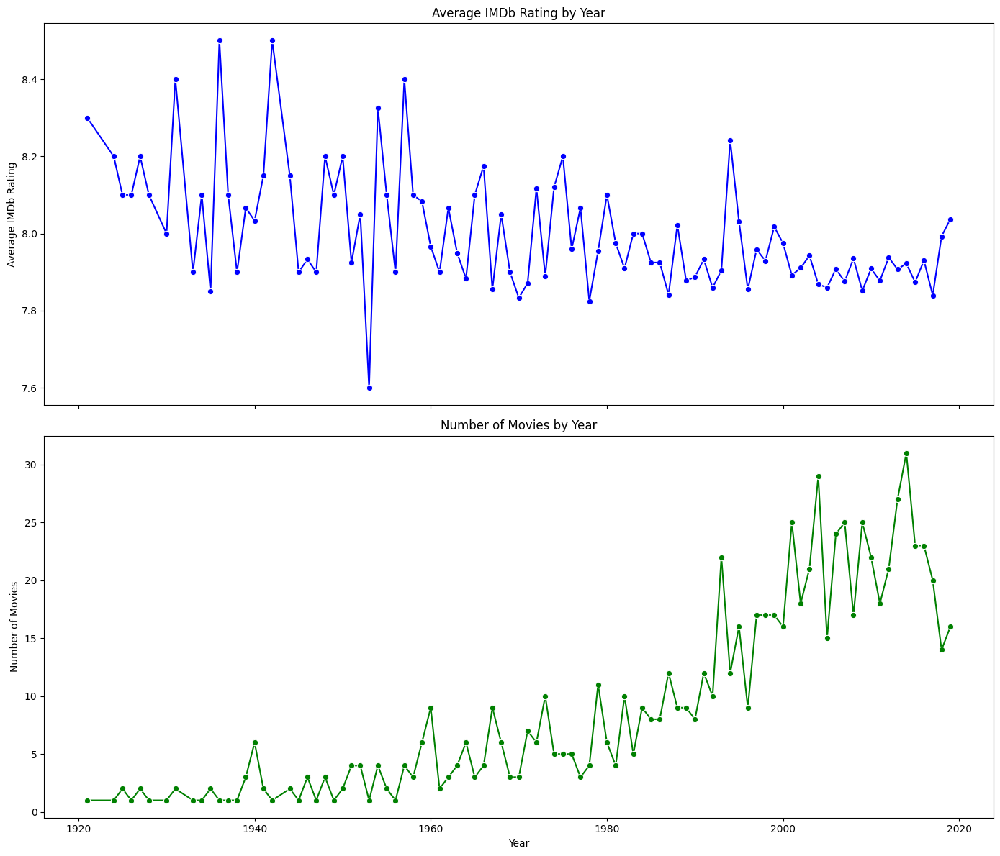

In [ ]:
# Grouping movies by release year to calculate average IMDb ratings and count of movies
yearly_trends = movies.groupby('released_year').agg(
    average_rating=('imdb_rating', 'mean'),
    num_movies=('imdb_rating', 'count')
).reset_index()

# Plotting trends in average IMDb ratings and number of movies over time
fig, ax = plt.subplots(2, 1, figsize=(14, 12), sharex=True)

sns.lineplot(x='released_year', y='average_rating', data=yearly_trends, ax=ax[0], marker='o', color='blue')
ax[0].set_title('Average IMDb Rating by Year')
ax[0].set_ylabel('Average IMDb Rating')

sns.lineplot(x='released_year', y='num_movies', data=yearly_trends, ax=ax[1], marker='o', color='green')
ax[1].set_title('Number of Movies by Year')
ax[1].set_xlabel('Year')
ax[1].set_ylabel('Number of Movies')

plt.tight_layout()
plt.show()

In [ ]:
# Splitting genres and expanding them into separate rows per year
expanded_genre_year = movies.dropna(subset=['released_year']).copy()
expanded_genre_year['genres_list'] = expanded_genre_year['genre'].str.split(', ')
expanded_genre_year = expanded_genre_year.explode('genres_list')

# Grouping by year and genre to count occurrences
genre_popularity_over_time = expanded_genre_year.groupby(['released_year', 'genres_list']).size().unstack(fill_value=0)

# Normalizing the data by year to show the proportion of each genre per year
genre_proportions = genre_popularity_over_time.div(genre_popularity_over_time.sum(axis=1), axis=0)

# Plotting the results for the top 5 genres over time
top_genres = genre_proportions.mean().sort_values(ascending=False).head(5).index
plt.figure(figsize=(14, 8))
sns.lineplot(data=genre_proportions[top_genres], dashes=False)
plt.title('Genre Popularity Over Time (Top 5 Genres)')
plt.xlabel('Year')
plt.ylabel('Proportion of Total Films')
plt.legend(title='Genre')
plt.show()

In [ ]:
# Calculating average runtime per year
runtime_trends = movies.groupby('released_year').agg(
    average_runtime=('runtime', 'mean')
).reset_index()

# Plotting the average runtime by year
plt.figure(figsize=(14, 6))
sns.lineplot(x='released_year', y='average_runtime', data=runtime_trends, marker='o', color='red')
plt.title('Average Movie Runtime by Year')
plt.xlabel('Year')
plt.ylabel('Average Runtime (minutes)')
plt.grid(True)
plt.show()

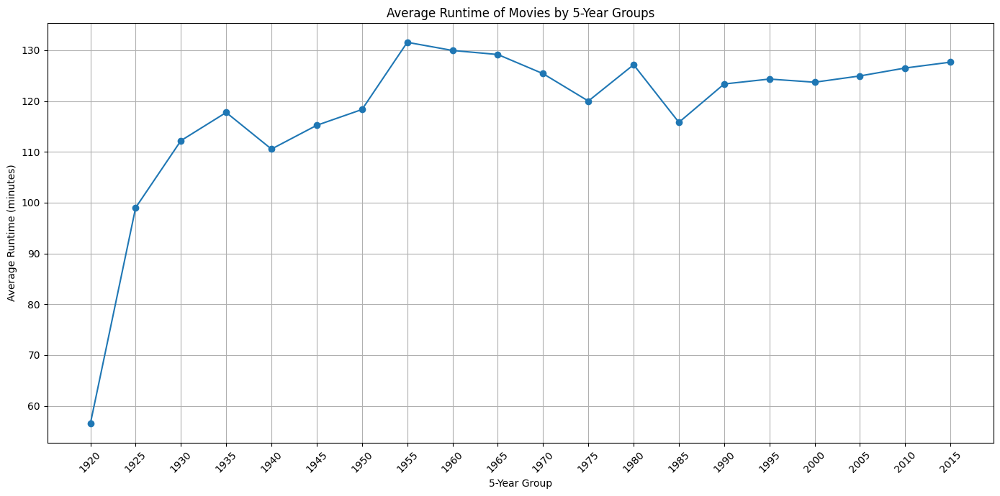

In [ ]:
# Calculate the average runtime per 5-year group
runtime_by_five_year_group = movies.groupby('five_year_group').agg(
    average_runtime=pd.NamedAgg(column='runtime', aggfunc='mean')
).reset_index()

# Plotting the average runtime per 5-year group
plt.figure(figsize=(14, 7))
plt.plot(runtime_by_five_year_group['five_year_group'], runtime_by_five_year_group['average_runtime'], marker='o')
plt.title('Average Runtime of Movies by 5-Year Groups')
plt.xlabel('5-Year Group')
plt.ylabel('Average Runtime (minutes)')
plt.grid(True)
plt.xticks(runtime_by_five_year_group['five_year_group'], rotation=45)  # Ensure all labels are shown and rotated for better readability
plt.tight_layout()
plt.show()

Word Cloud for 1920.0 to 1924.0


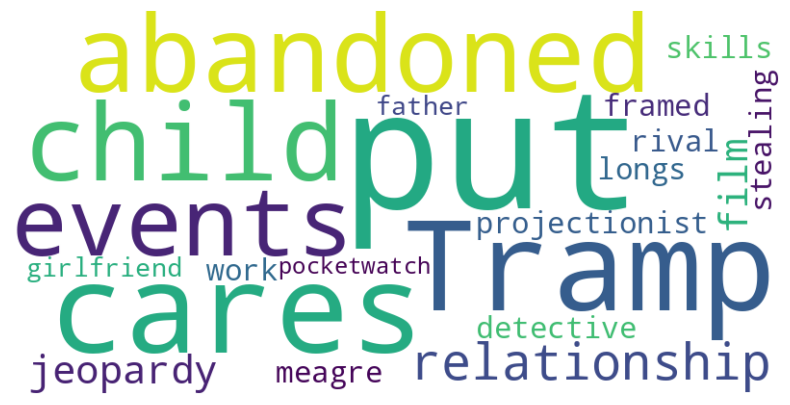

Word Cloud for 1925.0 to 1929.0


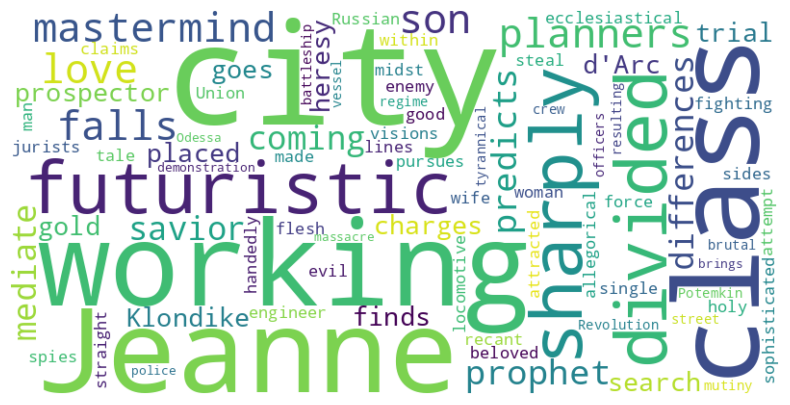

Word Cloud for 1930.0 to 1934.0


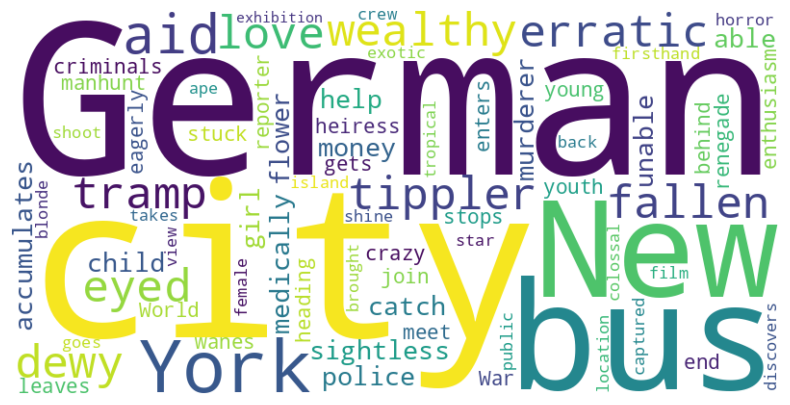

Word Cloud for 1935.0 to 1939.0


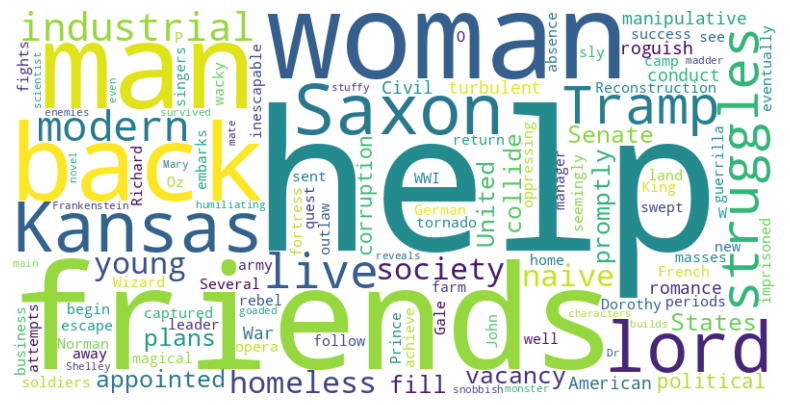

Word Cloud for 1940.0 to 1944.0


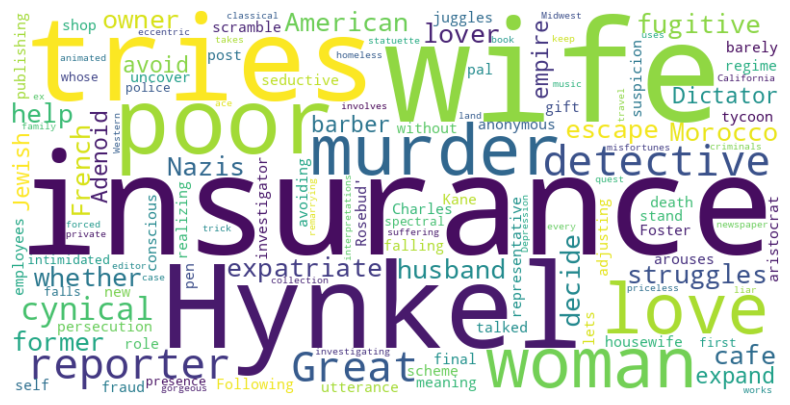

Word Cloud for 1945.0 to 1949.0


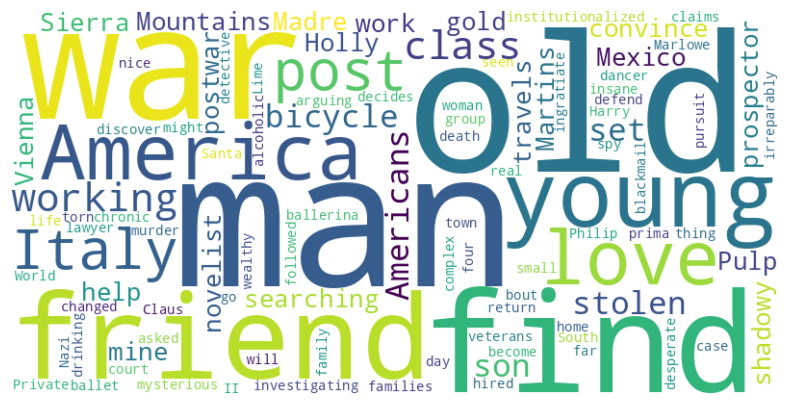

Word Cloud for 1950.0 to 1954.0


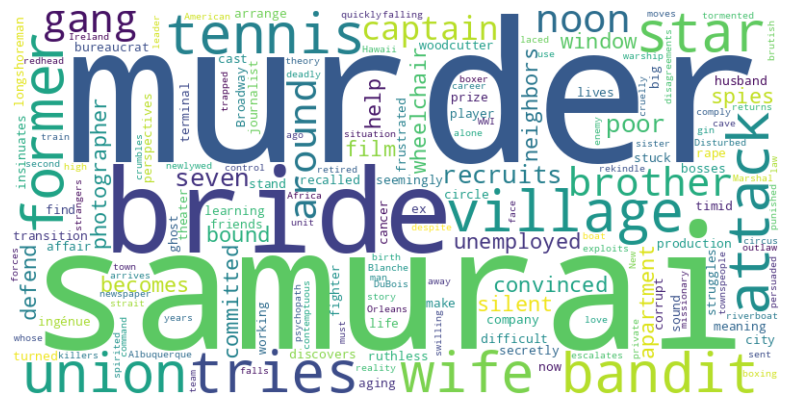

Word Cloud for 1955.0 to 1959.0


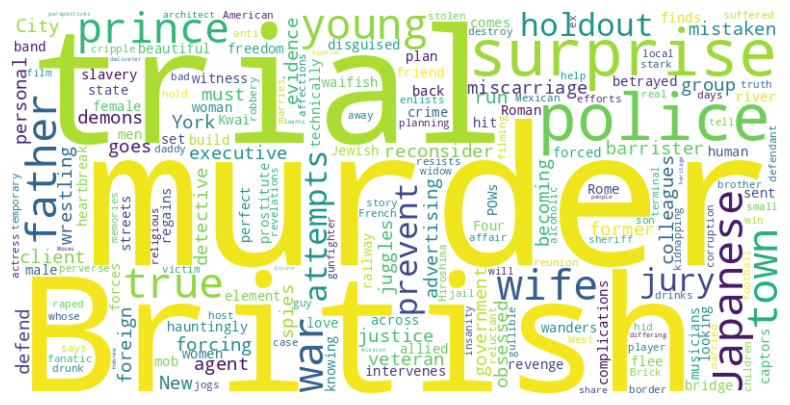

Word Cloud for 1960.0 to 1964.0


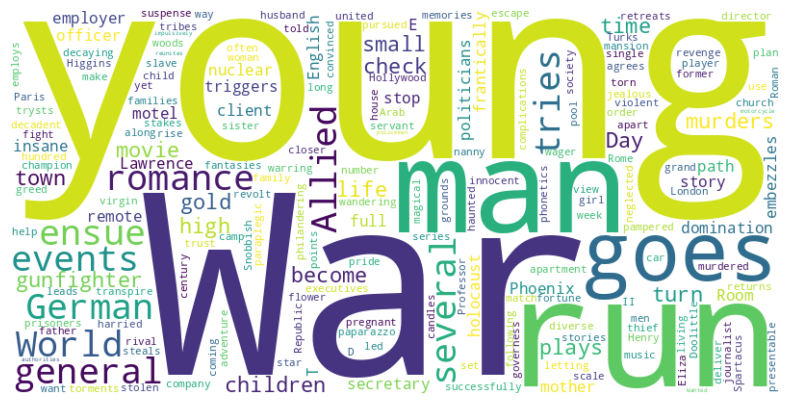

Word Cloud for 1965.0 to 1969.0


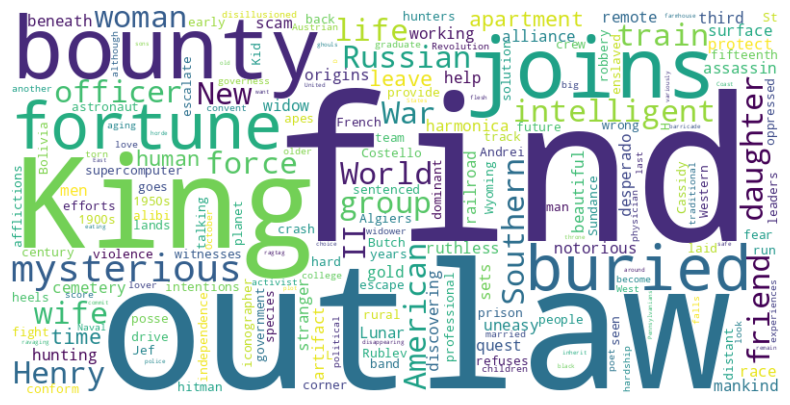

Word Cloud for 1970.0 to 1974.0


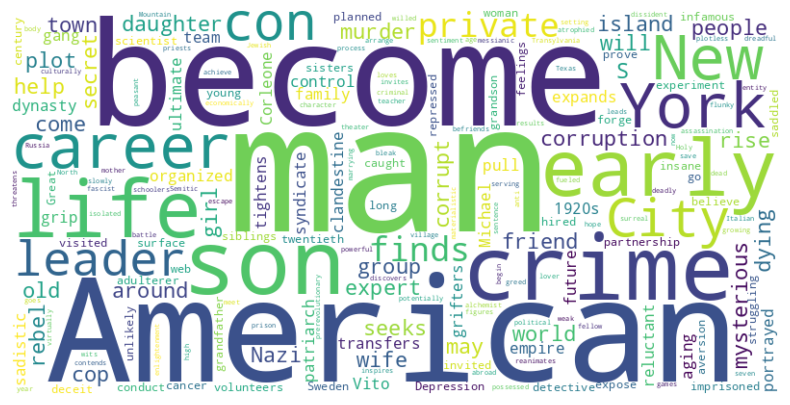

Word Cloud for 1975.0 to 1979.0


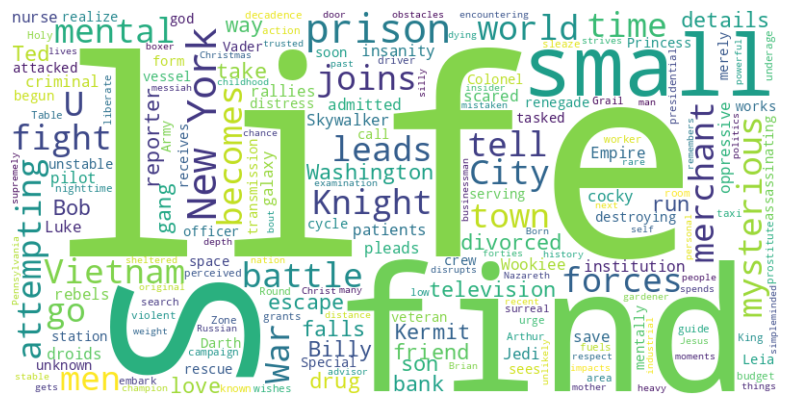

Word Cloud for 1980.0 to 1984.0


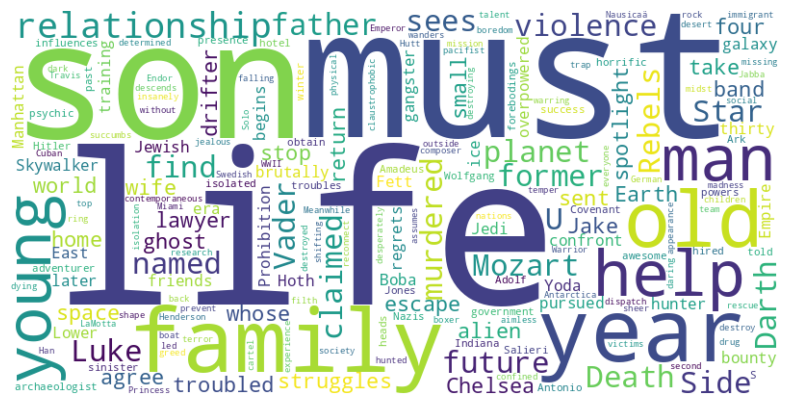

Word Cloud for 1985.0 to 1989.0


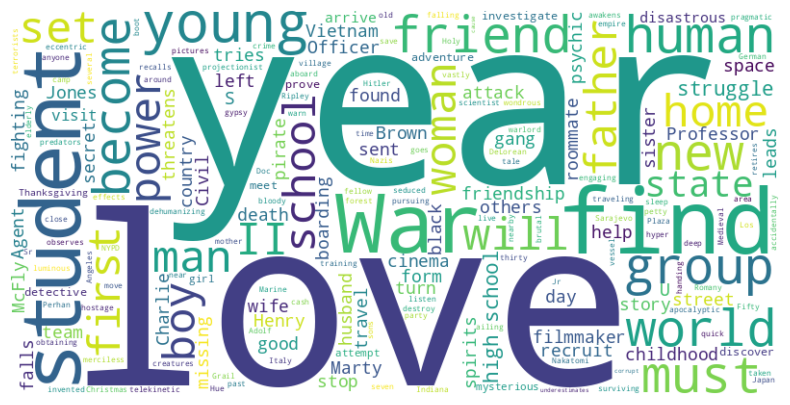

Word Cloud for 1990.0 to 1994.0


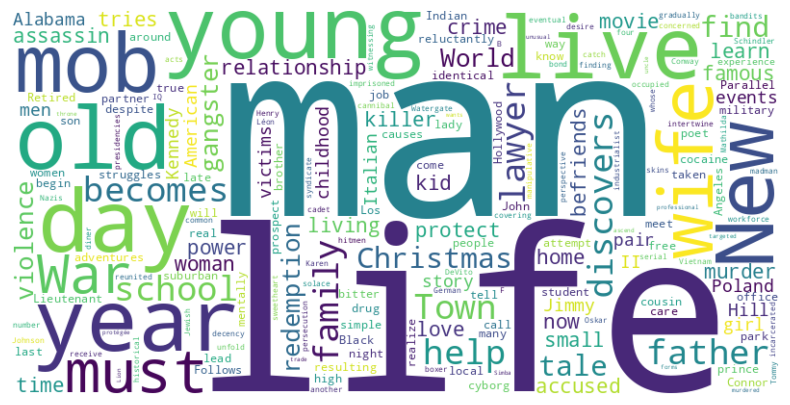

Word Cloud for 1995.0 to 1999.0


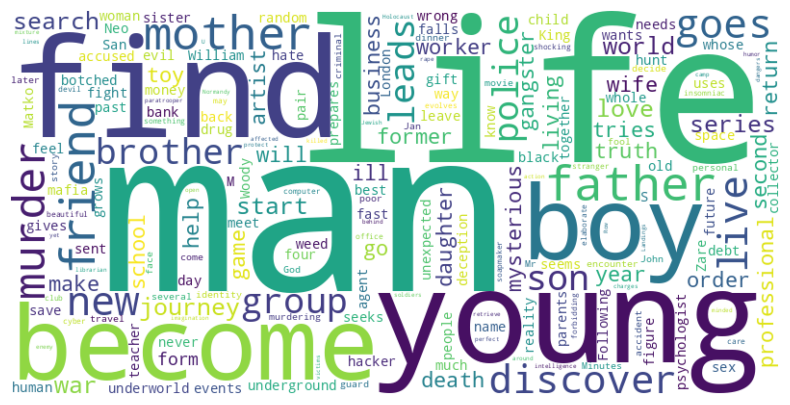

Word Cloud for 2000.0 to 2004.0


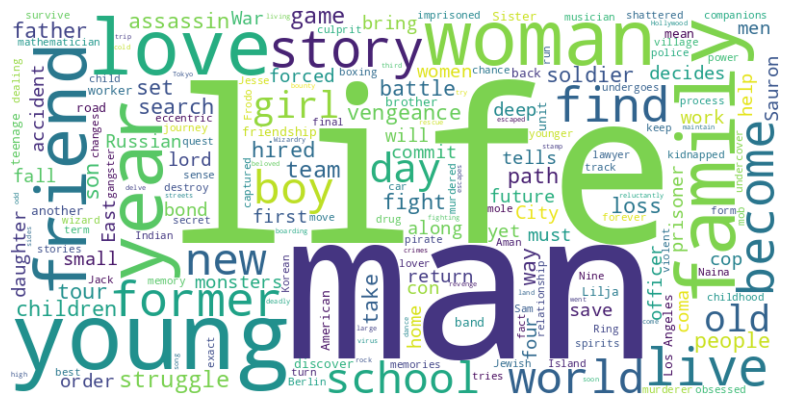

Word Cloud for 2005.0 to 2009.0


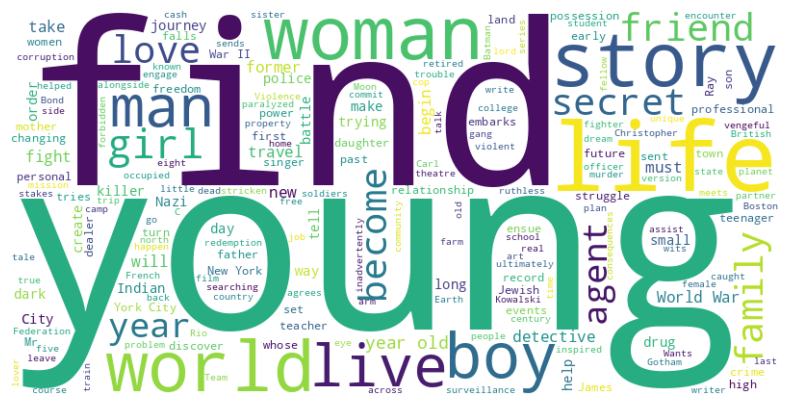

Word Cloud for 2010.0 to 2014.0


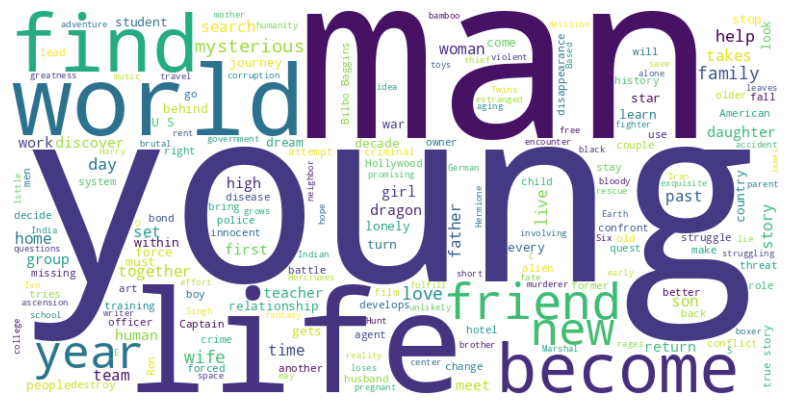

Word Cloud for 2015.0 to 2019.0


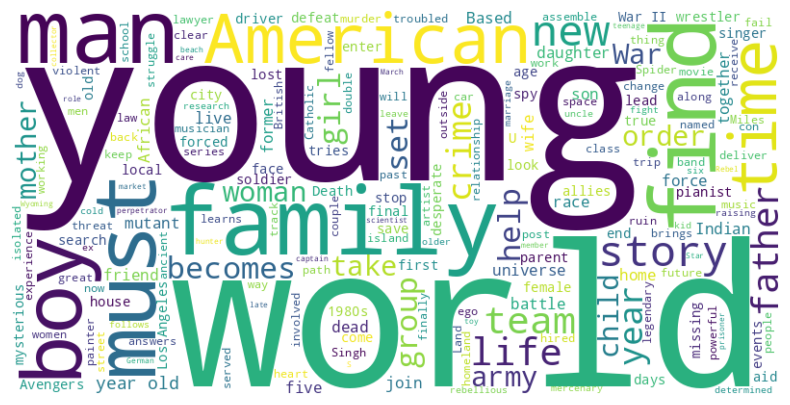

In [ ]:
from wordcloud import WordCloud, STOPWORDS

def generate_wordcloud(text):
    additional_stopwords = {'one', 'two', 'three'}

    # Combine the default and additional stopwords
    stopwords = set(STOPWORDS).union(additional_stopwords)

    # Wordcloud image
    wordcloud = WordCloud(width=800, height=400, background_color='white', stopwords=stopwords).generate(text)

    # Display it
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

# Aggregate overviews for each 5-year group
overview_by_five_year_group = movies.groupby('five_year_group')['overview'].apply(' '.join).reset_index()

# Generate word clouds for each 5-year group, using loops
for index, row in overview_by_five_year_group.iterrows():
    print(f"Word Cloud for {row['five_year_group']} to {row['five_year_group'] + 4}")
    generate_wordcloud(row['overview'])

Word Cloud for the 1920.0s


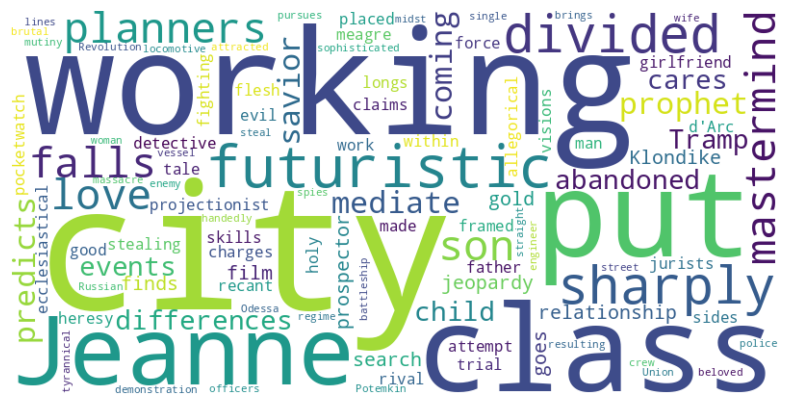

Word Cloud for the 1930.0s


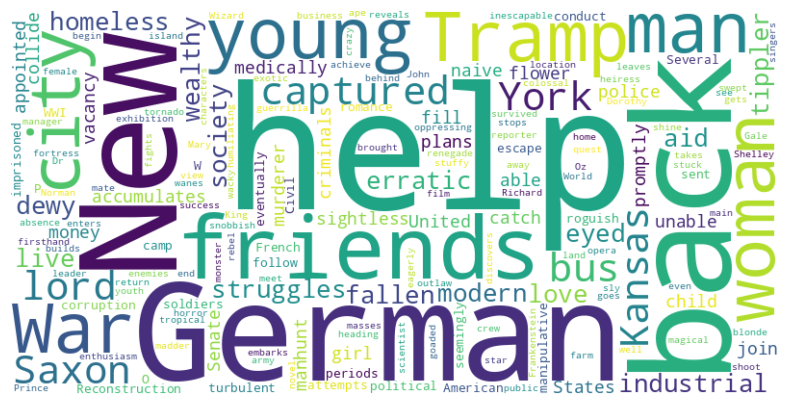

Word Cloud for the 1940.0s


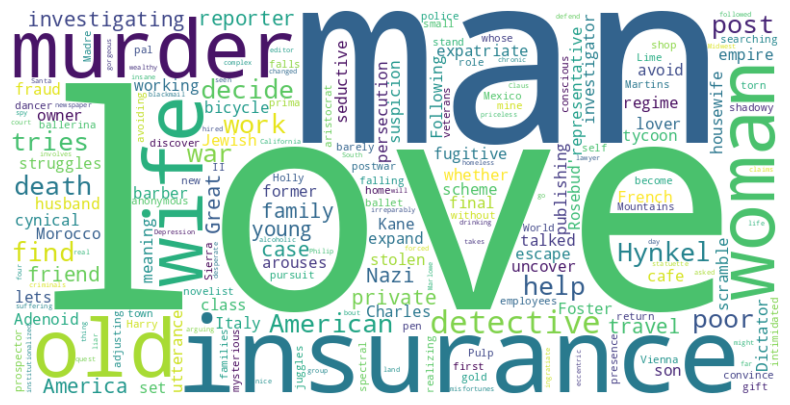

Word Cloud for the 1950.0s


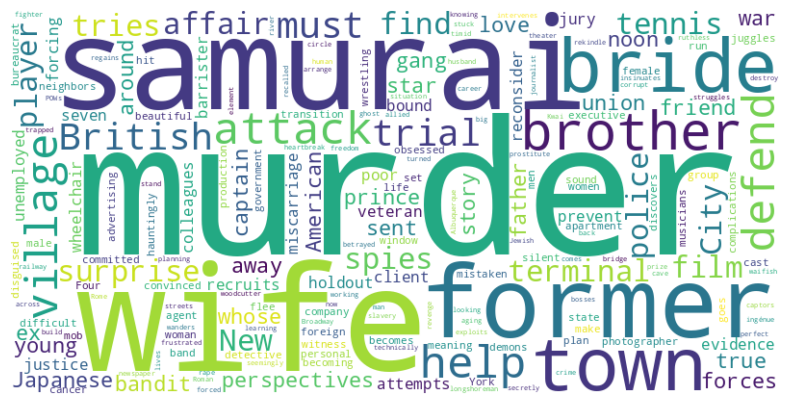

Word Cloud for the 1960.0s


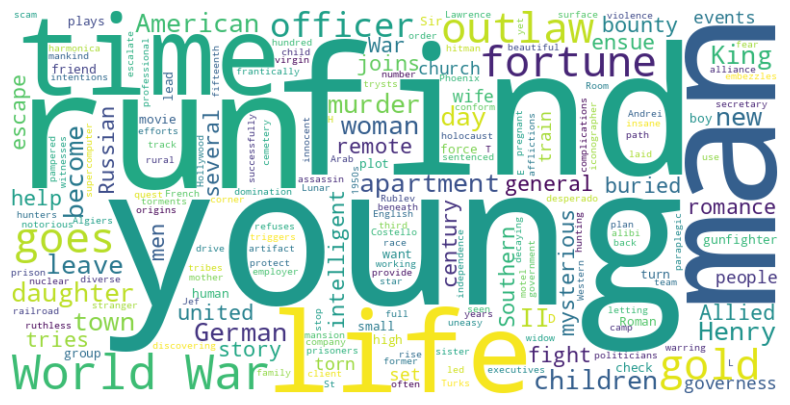

Word Cloud for the 1970.0s


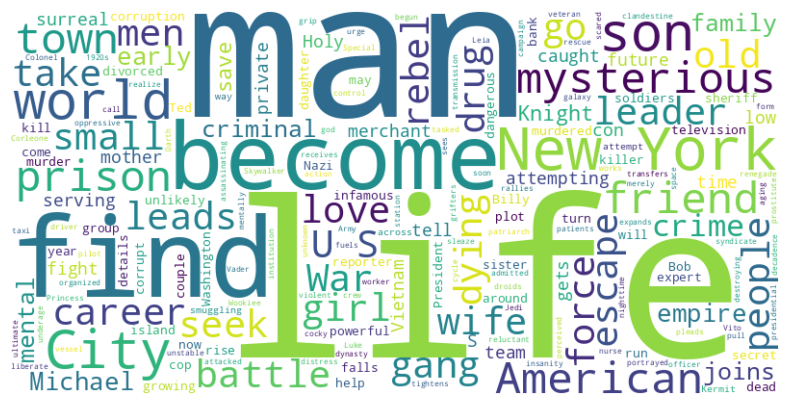

Word Cloud for the 1980.0s


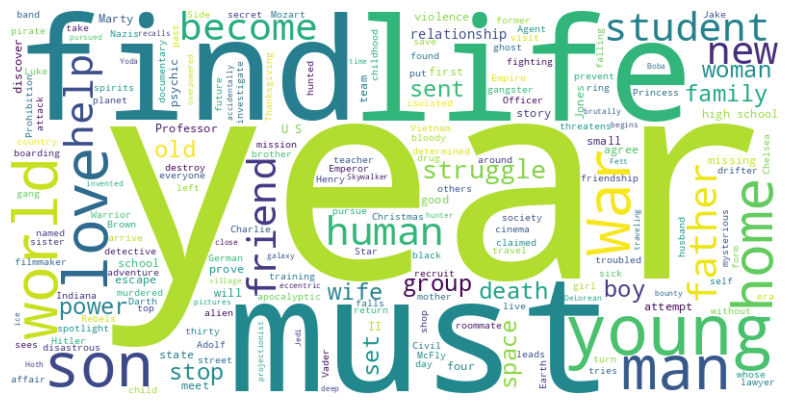

Word Cloud for the 1990.0s


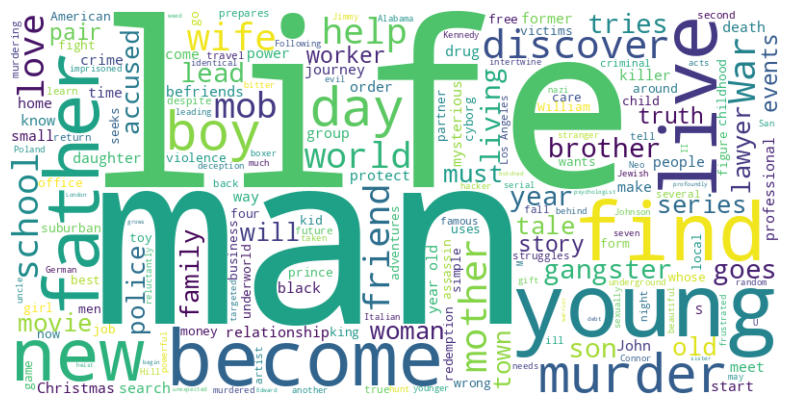

Word Cloud for the 2000.0s


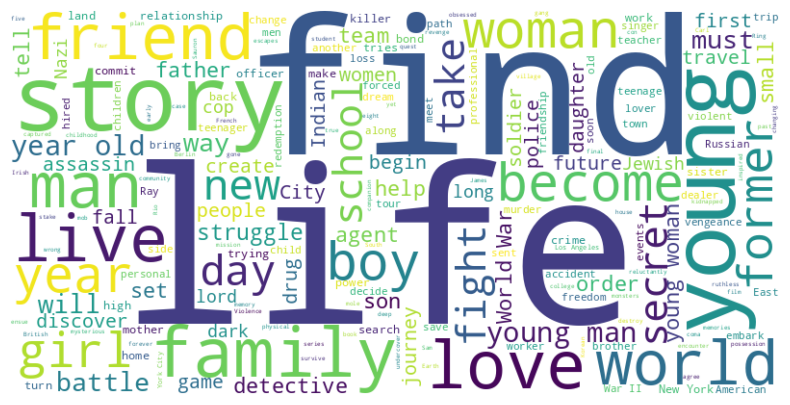

Word Cloud for the 2010.0s


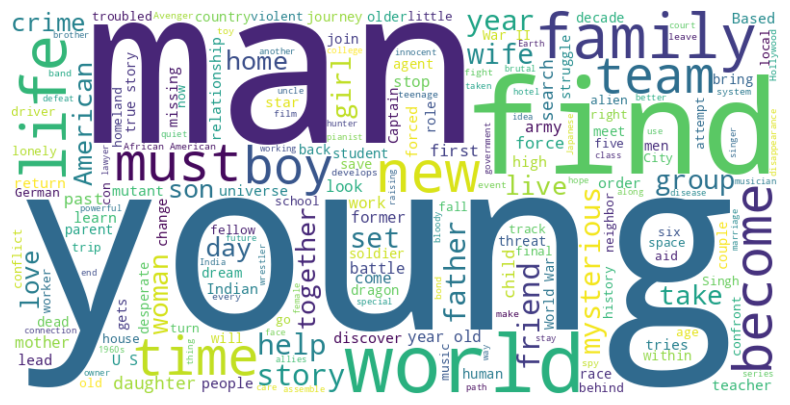

In [ ]:
# Same for decades
overview_by_decade = movies.groupby('decade')['overview'].apply(' '.join).reset_index()

# Generate it
for index, row in overview_by_decade.iterrows():
    print(f"Word Cloud for the {row['decade']}s")
    generate_wordcloud(row['overview'])